# Aligning three MSI modalities (metabolomics, lipidomics pos/neg) onto Visium HD

Same architecture as `examples/l12_walkthrough.ipynb`, generalized from two MSI modalities to
three: metabolomics, lipidomics negative, and lipidomics positive are each acquired from a
**different physical section** of the same tissue block (matrix preparation differs per assay),
so each MSI grid is first aligned onto **its own** H&E scan (`sw.align_grid`), and each of those
three H&E images is then **independently** registered against the Visium HD slide's own H&E --
unlike L12's lipid+metabo pair, there's no shared H&E here to reuse a single registration for,
since all three sections are physically different.

**Image sizes**: every H&E scan involved here is enormous -- tens of thousands of pixels per
side, multi-GB uncompressed TIFFs. `examples/large_image_utils.py`'s `load_downsampled_image`
reads a strided, downsampled view via `tifffile`+`zarr` lazily, touching only the tiles needed
for the requested stride, rather than decoding the full file (which a plain `imageio.imread` or
computing a lower SpatialData multiscale pyramid level would both end up doing -- pyramid
levels are lazily coarsened *from* the full-resolution array, so even a "small" level means
reading the entire source image).

**Two environment-specific notes:**

- This particular Space Ranger output isn't dataset-id-prefixed (`feature_slice.h5`, not
  `DD1974_feature_slice.h5`), which `spatialdata_io.visium_hd()` requires -- Step 1 creates a
  symlink for it automatically if missing.
- For the Visium HD reference image, this notebook uses `spatialdata_io`'s own precomputed
  `hires_image` (same proven pattern as the classic-Visium notebooks) rather than downsampling
  the raw fullres `DD1974.tif` directly -- that specific file's strided zarr read came back
  completely blank (an unexplained tifffile/zarr issue with this non-tiled TIFF), so `hires_image`
  is both simpler and actually correct.

In [1]:
import os
import sys
sys.path.insert(0, "msi")  # examples/msi/ contains msi_loader.py (MSI vendor CSV parsing)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import spatialdata as sd
from spatialdata import SpatialData
from spatialdata.models import Image2DModel
import spatialdata_io
import spatialwarp as sw

from msi_loader import MSIdata
from large_image_utils import load_downsampled_image

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:504: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left = partial(_left_join_spatialelement_table)
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:505: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left_exclusive = partial(_left_exclusive_join_

A couple of steps below open a window where you click points with your mouse. For that to
work in Jupyter, run this cell first to switch to a real window backend instead of the default
static-image mode (`tk` works out of the box with no extra install; use `qt` instead if you
have PyQt5/PySide installed and prefer it).

In [2]:
%matplotlib tk

## Step 1 -- Load Visium HD

`fullres_image_file` is still required (even though we won't read pixels from it directly) so
`obsm['spatial']` comes out calibrated in true full-resolution pixel space -- without it,
`spatialdata_io` only loads the downscaled preview images, which don't match `obsm['spatial']`
pixel-for-pixel. `hires_scale` is Space Ranger's own `downscaled_hires` factor, same rescale
pattern used throughout the classic-Visium notebooks.

In [3]:
visium_outs = "/home/croizer/Documents/04_Collaborations/03_Genial/SpatialWarp/DD1974/outs"
visium_fullres_tif = "/home/croizer/Documents/04_Collaborations/03_Genial/SpatialWarp/DD1974/DD1974.tif"

# this Space Ranger output isn't dataset-id-prefixed; spatialdata_io.visium_hd() expects
# "DD1974_feature_slice.h5" specifically to locate the HD layout metadata
feature_slice_link = os.path.join(visium_outs, "DD1974_feature_slice.h5")
if not os.path.exists(feature_slice_link):
    os.symlink("feature_slice.h5", feature_slice_link)

visium_raw_sdata = spatialdata_io.visium_hd(
    visium_outs, dataset_id="DD1974", bin_size=16, fullres_image_file=visium_fullres_tif,
)

hires_scale = sd.transformations.get_transformation(
    visium_raw_sdata.shapes["DD1974_square_016um"], "downscaled_hires"
).scale[0]
visium_he_array = sw.extract_image(visium_raw_sdata, key="DD1974_hires_image")

visium_table = visium_raw_sdata.tables["square_016um"].copy()
visium_table.obsm["spatial"] = visium_table.obsm["spatial"] * hires_scale

visium_sdata = SpatialData(
    images={"he": Image2DModel.parse(np.moveaxis(np.atleast_3d(visium_he_array), -1, 0))},
    tables={"visium": visium_table},
)
visium_sdata

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'DD1974_square_016um', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


SpatialData object
├── Images
│     └── 'he': DataArray[cyx] (3, 3149, 6000)
└── Tables
      └── 'visium': AnnData (137858, 18085)
with coordinate systems:
    ▸ 'global', with elements:
        he (Images)

## Step 2 -- Per-modality config

Each modality's CSV exports (same `MSIdata` loader as every other notebook) plus its own H&E
image. Note the different intensity-file choice per modality (`Root Mean Square` for
metabolomics, `Total Ion Count` for both lipidomics runs) -- whatever normalization each export
actually provides.

In [8]:
image_base = "/home/croizer/Documents/04_Collaborations/03_Genial/SpatialWarp/DD1974"
alix_base = "/home/croizer/Downloads/transfer_544950_files_937b8558"

modalities = {
    "metabo": {
        "intensity": f"{alix_base}/Results-Metabolomics/Statistic files/1974/Regions-Root Mean Square.csv",
        "annotation": f"{alix_base}/Results-Metabolomics/Library/Metabolomics.csv",
        "region": f"{alix_base}/Results-Metabolomics/Statistic files/1974/20260205_Brosch_Metab1974.csv",
        "he_image": f"{image_base}/815_section2.ome.tif",
    },
    "lipidneg": {
        "intensity": f"{alix_base}/Results-Lipidomics Negative/Statistic files/1974/Regions-Total Ion Count.csv",
        "annotation": f"{alix_base}/Results-Lipidomics Negative/Library/Lipidomics Negative.csv",
        "region": f"{alix_base}/Results-Lipidomics Negative/Statistic files/1974/20260206_Brosch_Lip_Neg_1974.csv",
        "he_image": f"{image_base}/820_section2.ome.tif",
    },
    "lipidpos": {
        "intensity": f"{alix_base}/Results-Lipidomics-Positive/Statistic files/1974/Regions-Total Ion Count.csv",
        "annotation": f"{alix_base}/Results-Lipidomics-Positive/Library/Lipidmics positive.csv",
        "region": f"{alix_base}/Results-Lipidomics-Positive/Statistic files/1974/20260209_Brosch_Lip_Pos1974.csv",
        "he_image": f"{image_base}/816_section2.ome.tif",
    },
}

# stride for load_downsampled_image -- these H&E scans are ~25-50k px/side; 20 brings them
# down to a few thousand px, plenty for landmark picking and elastic registration
downsample = 20

## Step 3 -- Align each MSI grid onto its own H&E

Same recipe as every other notebook's own-H&E step, looped over the three modalities: load the
MSI points/features, load that modality's own (downsampled) H&E, `sw.build_spatialdata` +
`sw.align_grid`. A window opens per modality in turn for landmark picking -- close it to move to
the next one.

In [9]:
he_arrays = {}
msi_points = {}
msi_sdata = {}

for name, cfg in modalities.items():
    msi = MSIdata(cfg["intensity"], cfg["annotation"], cfg["region"])
    counts = msi.get_count_formated()
    points_xy = msi.coordinates[["x", "y"]].values.astype(float)
    features = counts.drop(columns=["x", "y"])
    msi_points[name] = (points_xy, features)

    he_array, he_scale = load_downsampled_image(cfg["he_image"], downsample)
    he_arrays[name] = he_array

    raw_sdata = sw.build_spatialdata(he_array, points_xy, values=features, image_key="he", table_key="msi")
    msi_sdata[name] = sw.align_grid(
        raw_sdata,
        image_key="he",
        table_key="msi",
        output_csv=f"transformed_coordinates_DD1974_{name}.csv",
        mesh_size=(8, 8),
        number_of_iterations=100,
    )
    print(f"{name}: {points_xy.shape[0]} MSI points aligned onto its own H&E ({he_array.shape})")

INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
metabo: 118795 MSI points aligned onto its own H&E ((2517, 1351, 3))
INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
lipidneg: 122451 MSI points aligned onto its own H&E ((2514, 1271, 3))
INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
lipidpos: 102225 MSI points aligned onto its own H&E ((2209, 1191, 3))


**Check it worked:** one overlay per modality -- colored spots should trace out real tissue
features on that modality's own H&E, not float off to one side. If a modality's MSI grid comes
out mirrored (a vendor coordinate quirk seen on some instruments), flip that modality's
`points_xy[:, 0] = points_xy[:, 0].max() - points_xy[:, 0]` before Step 3 and re-run.

In [10]:
for name in modalities:
    table = msi_sdata[name].tables["msi"]
    sw.plot_overlay(
        image=he_arrays[name],
        points_xy=table.obsm["spatial"],
        values=table.X.sum(axis=1),
    )

## Step 4 -- Register each modality's H&E against Visium HD, then merge

Each modality's own H&E is a genuinely different physical section, so each needs its own
registration against `visium_he_array` -- no shared transform to reuse (unlike L12's Step 4).
Every modality's matched features get reindexed onto the first modality's matched bins, building
up one combined `merged` object -- same pattern as `examples/align_five_visium_sections.ipynb`.

`distance_threshold` is in Visium HD hires-image pixels; start small and loosen it if too few
bins match, based on the QC plot below.

In [11]:
merged = None
registration_results = {}

for name, cfg in modalities.items():
    he_array = he_arrays[name]

    moving_landmarks, fixed_landmarks, _, _ = sw.pick_landmarks(
        he_array, visium_he_array, output_csv=f"landmarks_{name}_DD1974.csv"
    )

    registration_result = sw.register_elastic(
        moving_image=he_array,
        fixed_image=visium_he_array,
        moving_landmarks=moving_landmarks,
        fixed_landmarks=fixed_landmarks,
        mesh_size=(8, 8),
        number_of_iterations=100,
    )
    registration_result.save(f"registration_{name}_DD1974")
    registration_results[name] = registration_result

    result = sw.align(
        moving=msi_sdata[name],
        fixed=visium_sdata,
        registration_result=registration_result,
        distance_threshold=15.0,
        moving_table_key="msi",
        fixed_table_key="visium",
        moving_obsm_key=name,
    )
    print(f"{name}: kept {result.n_obs} of {visium_sdata.tables['visium'].n_obs} Visium HD bins")

    if merged is None:
        merged = result
    else:
        merged.obsm[name] = result.obsm[name].reindex(merged.obs_names)

print(f"\nfinal merged: {merged.n_obs} bins, modalities: {list(registration_results)}")
merged

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


metabo: kept 137384 of 137858 Visium HD bins


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


lipidneg: kept 137507 of 137858 Visium HD bins
lipidpos: kept 137613 of 137858 Visium HD bins

final merged: 137384 bins, modalities: ['metabo', 'lipidneg', 'lipidpos']


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 137384 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'nearest_index', 'nearest_distance'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs', 'spatialwarp'
    obsm: 'spatial', 'spatial_warped', 'metabo', 'lipidneg', 'lipidpos'

`merged` is now a regular Visium HD `AnnData` object with gene expression as usual, plus
`obsm["metabo"]`, `obsm["lipidneg"]`, and `obsm["lipidpos"]` -- one object holding all four
modalities, jointly indexed by bin.

The plot below is a final visual sanity check: `merged.obsm["spatial_warped"]` comes from
`metabo`'s registration specifically (the first modality processed, which is what `merged`
itself was built from in Step 4) -- which bins it kept after that modality's distance filter
should trace out the tissue shape, not a scattered cloud.

In [ ]:
plt.scatter(*merged.obsm["spatial_warped"].T, s=2, alpha=0.3)
plt.gca().invert_yaxis()
plt.gca().set_aspect("equal")
plt.title("Visium HD bins kept after metabo's distance filter")
plt.show()

In [13]:
merged.obsm["lipidneg"].columns

Index(['LPE 16:0', 'LPE 18:1', 'LPE 18:0', 'LPE 20:4', 'LPE 20:3', 'LPS 20:4',
       'LPI 16:0', 'LPI 18:1', 'LPI 18:0', 'LPI 20:4', 'LPI 20:3', 'PE 32:1',
       'PE O 34:2 / PE P 34:1', 'PE 34:3', 'PE 34:2', 'PE 34:1', 'PE 34:0',
       'PE O 36:5 / PE P 36:4', 'PE O 36:3 / PE P 36:2',
       'PE O 36:2 / PE P 36:1', 'PE 36:5', 'PE 36:4', 'PE 36:3', 'PE 36:2',
       'PE 36:1', 'PG 34:2', 'PE O 38:7 / PE P 38:6', 'PE O 38:6 / PE P 38:5',
       'PE O 38:5 / PE P 38:4', 'PS 34:1', 'PE 38:6', 'PE 38:5', 'PE 38:4',
       'PE 38:3', 'PG 36:4', 'PE 38:2', 'PG 36:3', 'PE 38:1', 'PG 36:2',
       'PE O 40:6 / PE P 40:5', 'PG 36:0', 'SHexCer 34:1 O2',
       'PE O 40:5 / PE P 40:4', 'PE O 40:4 / PE P 40:3', 'PS 36:4', 'PS 36:2',
       'PS 36:1', 'PE 40:6', 'PE 40:5', 'PE 40:4', 'PE 40:3',
       'SHexCer 36:4 O2', 'PI 32:1', 'PS 38:5', 'PI 32:0', 'PS 38:4',
       'PG 40:7', 'PI 34:2', 'PI 34:1', 'PG 42:3', 'PS 42:9', 'PI 36:4',
       'PI 36:3', 'PI 36:2', 'PI 36:1', 'PG 44:12', 'PI 38:6

In [28]:
sorted(merged.obsm["lipidpos"].columns)

['CAR 18:0',
 'CAR 18:1',
 'LPC 16:0',
 'LPC 16:0 [M+K]+',
 'LPC 16:0 [M+Na]+ # LPC 18:3',
 'LPC 18:0',
 'LPC 18:0 [M+K]+',
 'LPC 18:0 [M+Na]+ # LPC 20:3',
 'LPC 18:1',
 'LPC 18:1 [M+Na]+ # LPC 20:4',
 'PC 30:0',
 'PC 30:0 [M+K]+*',
 'PC 30:0 [M+Na]+ # PC 32:3',
 'PC 32:0',
 'PC 32:0 [M+K]+*',
 'PC 32:0 [M+Na]+ # PC 34:3',
 'PC 32:1',
 'PC 32:1 [M+K]+*',
 'PC 32:1 [M+Na]+ # PC 34:4',
 'PC 32:2',
 'PC 32:2 [M+K]+*',
 'PC 34:0 [M+Na]+ # PC 36:3',
 'PC 34:1',
 'PC 34:1 [M+K]+*',
 'PC 34:1 [M+Na]+ # PC 36:4',
 'PC 34:2 [M+K]+*',
 'PC 34:2 [M+Na]+ # PC 36:5',
 'PC 34:3 [M+K]+*',
 'PC 34:3 [M+Na]+ # PC 36:6',
 'PC 34:5 # PC 32:2 [M+Na]+',
 'PC 36:0 [M+Na]+ # PC 38:3',
 'PC 36:1',
 'PC 36:1 [M+K]+*',
 'PC 36:1 [M+Na]+ # PC 38:4',
 'PC 36:2',
 'PC 36:2 [M+K]+*',
 'PC 36:2 [M+Na]+ # PC 38:5',
 'PC 36:3 [M+K]+*',
 'PC 36:3 [M+Na]+ # PC 38:6',
 'PC 36:4 [M+K]+*',
 'PC 36:4 [M+Na]+ # PC 38:7',
 'PC 36:5 [M+K]+*',
 'PC 36:5 [M+Na]+ # PC 38:8',
 'PC 38:1 [M+Na]+ # PC 40:4',
 'PC 38:2 [M+K]+*',
 'PC 

In [34]:
sorted(merged.obsm["metabo"].columns)

['2-Hydroxyglutarate / Xylonolactone',
 '2-PG or 3-PG',
 '3-Methoxytyramine',
 "4'-Phosphopantothenate",
 '4-Guanidinobutanoate',
 '4-Hydroxyphenylpyruvate*',
 '6-Phosphogluconate',
 'ADP / dGDP',
 'AMP /dGMP',
 'ATP / dGTP',
 'Adenine',
 'Adenylosuccinate',
 'Asparagine*',
 'Asparaginyl-Glutamate*',
 'Asparaginyl-Methionine',
 'Asparaginyl-Proline',
 'Aspartate',
 'Azelate',
 'CDP-ethanolamine',
 'CMP',
 'Cholesterol sulfate',
 'Citrate/ Isocitrate*',
 'Citrylglutamate',
 'Coenzyme A (CoA)',
 'Cytidine',
 'DHAP / GAP',
 'Deoxyribose phosphate',
 'Dihydrothymine',
 'Dimethylarginine (SDMA + ADMA)',
 'Erythrose 4-phosphate',
 'Ethanolamine phosphate',
 'FA 14:0 (Myristate)',
 'FA 15:0',
 'FA 16:0 Palmitate',
 'FA 16:1 Palmiteoleate-Sapienate',
 'FA 17:0 Heptadecanoate',
 'FA 17:1 Heptadecenoate',
 'FA 18:0 Stearate',
 'FA 18:1 Oleate',
 'FA 18:2 Linoleate',
 'FA 18:3 Linolenate',
 'FA 20:0 (Arachidate)',
 'FA 20:1',
 'FA 20:2 (Eicosadienoate)',
 'FA 20:3 Dihomo-gamma-linolenate',
 'FA 2

In [46]:
%matplotlib inline

/tmp/ipykernel_228440/2743151026.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap(layer["cmap"])(norm(vals))


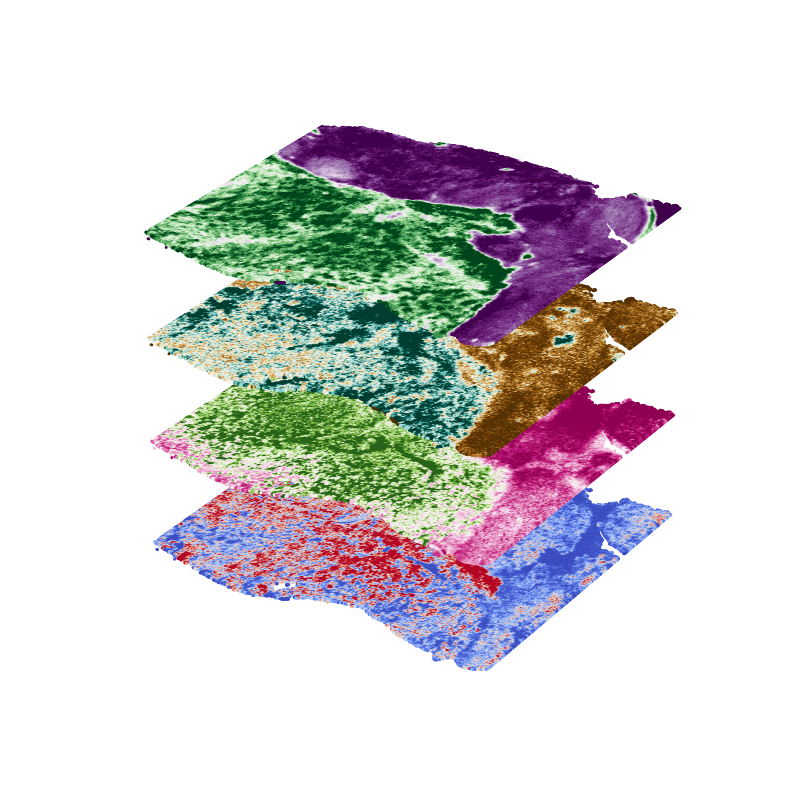

In [52]:
# --- choose features here ---
gene_name = "APOA2"
metabo_feature = 'Reduced glutathione (GSH)'
lipidneg_feature = "LPI 18:1"
lipidpos_feature =  'PC 36:0 [M+Na]+ # PC 38:3'

vmin_percentile = 10   # shared percentile -- each layer still gets its own vmin value from it
vmax_percentile = 90  # shared percentile -- each layer still gets its own vmax value from it
point_size = 1

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # registers '3d' projection
from matplotlib import cm
from matplotlib.colors import Normalize

# Get spatial coordinates (shared across layers -- merged's bins are all the same identity
# across modalities, just some entries are NaN wherever a given modality didn't match that bin)
coords = merged.obsm["spatial"]
x, y = coords[:, 0], coords[:, 1]

layers = [
    {"name": gene_name, "values": merged.obs_vector(gene_name), "cmap": "coolwarm", "z": 0},
    {"name": metabo_feature, "values": merged.obsm["metabo"][metabo_feature].fillna(0).values, "cmap": "PiYG", "z": 0.5},
    {"name": lipidneg_feature, "values": merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values, "cmap": "BrBG", "z": 1},
    {"name": lipidpos_feature, "values": merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values, "cmap": "PRGn", "z": 1.5},
]

fig = plt.figure(figsize=(8, 10))
ax = fig.add_subplot(111, projection="3d")

for layer in layers:
    vals = layer["values"]
    vmin = np.nanpercentile(vals, vmin_percentile)
    vmax = np.nanpercentile(vals, vmax_percentile)
    norm = Normalize(vmin=vmin, vmax=vmax)
    colors = cm.get_cmap(layer["cmap"])(norm(vals))

    z = np.full_like(x, layer["z"], dtype=float)

    ax.scatter(
        x, y, z,
        c=colors,
        s=point_size,
        depthshade=False,
        rasterized=True,
    )

    # optional: label each sheet
    # ax.text(x.max(), y.mean(), layer["z"], layer["name"], fontsize=9)

ax.set_box_aspect([1, 1, 0.8])   # tweak z-stretch
ax.set_axis_off()                # cleaner "stacked sheets" look
ax.view_init(elev=25, azim=-60)  # adjust viewing angle

plt.tight_layout()
plt.show()


/tmp/ipykernel_228440/3281860136.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap(layer["cmap"])(norm(vals))


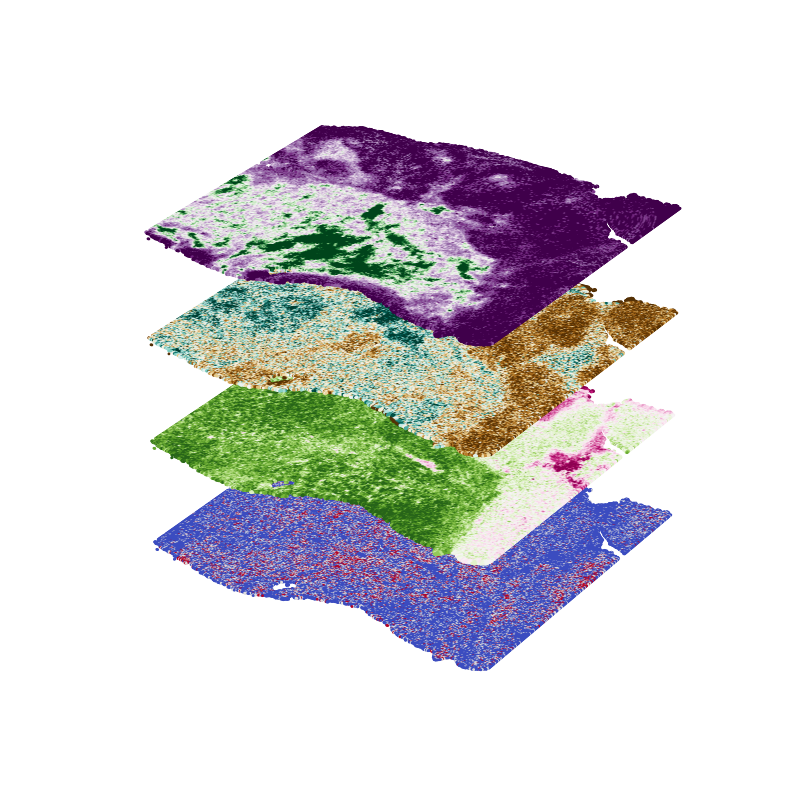

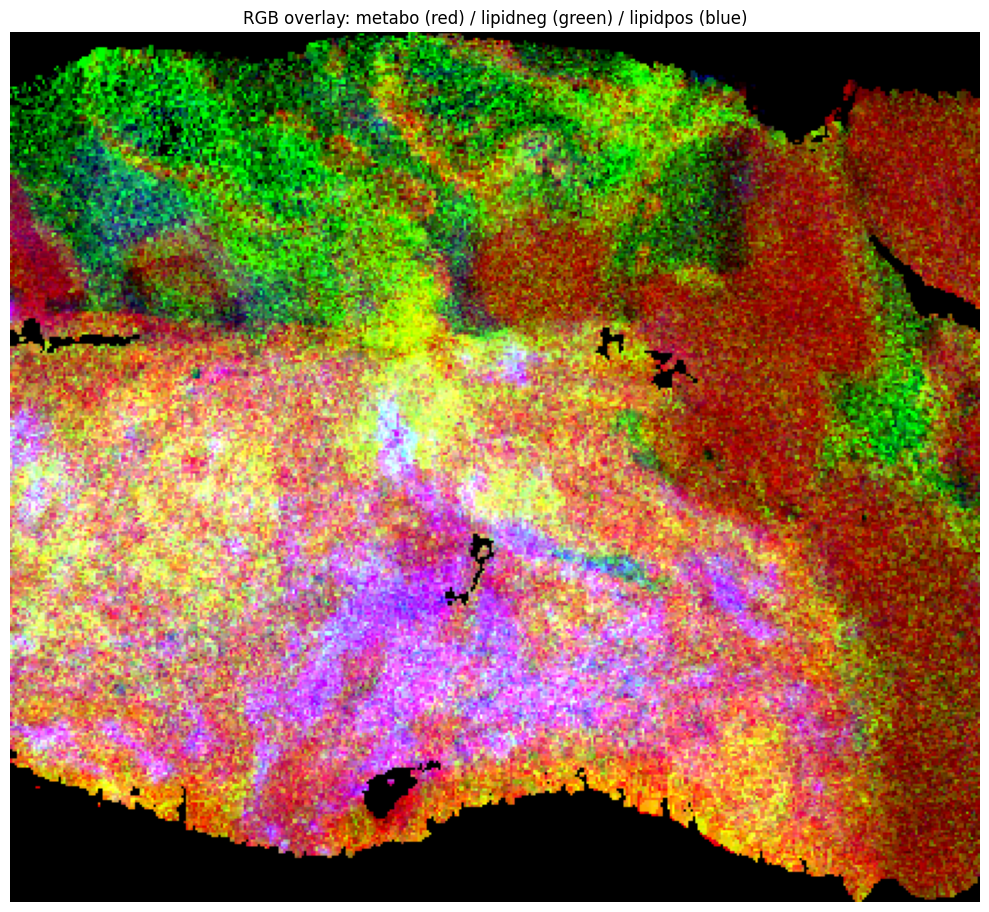

In [48]:
# --- choose features here ---
gene_name = "SOD2"
metabo_feature = "Glucose phosphate / Fructose phosphate*"
lipidneg_feature = "LPE 18:1"
lipidpos_feature = "CAR 18:1"

vmin_percentile = 5   # shared percentile -- each layer still gets its own vmin value from it
vmax_percentile = 95  # shared percentile -- each layer still gets its own vmax value from it
point_size = 1

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # registers '3d' projection
from matplotlib import cm
from matplotlib.colors import Normalize
from matplotlib.patches import Patch

# Get spatial coordinates (shared across layers -- merged's bins are all the same identity
# across modalities, just some entries are NaN wherever a given modality didn't match that bin)
coords = merged.obsm["spatial"]
x, y = coords[:, 0], coords[:, 1]

layers = [
    {"name": gene_name, "values": merged.obs_vector(gene_name), "cmap": "coolwarm", "z": 0},
    {"name": metabo_feature, "values": merged.obsm["metabo"][metabo_feature].fillna(0).values, "cmap": "PiYG", "z": 0.5},
    {"name": lipidneg_feature, "values": merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values, "cmap": "BrBG", "z": 1},
    {"name": lipidpos_feature, "values": merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values, "cmap": "PRGn", "z": 1.5},
]

fig = plt.figure(figsize=(8, 10))
ax = fig.add_subplot(111, projection="3d")

for layer in layers:
    vals = layer["values"]
    vmin = np.nanpercentile(vals, vmin_percentile)
    vmax = np.nanpercentile(vals, vmax_percentile)
    norm = Normalize(vmin=vmin, vmax=vmax)
    colors = cm.get_cmap(layer["cmap"])(norm(vals))

    z = np.full_like(x, layer["z"], dtype=float)

    ax.scatter(
        x, y, z,
        c=colors,
        s=point_size,
        depthshade=False,
        rasterized=True,
    )

    # optional: label each sheet
    # ax.text(x.max(), y.mean(), layer["z"], layer["name"], fontsize=9)

ax.set_box_aspect([1, 1, 0.8])   # tweak z-stretch
ax.set_axis_off()                # cleaner "stacked sheets" look
ax.view_init(elev=25, azim=-60)  # adjust viewing angle

plt.tight_layout()
plt.show()
# --- RGB merge, rendered as a true grid of squares (Visium HD bins sit on a real regular
# grid, unlike classic Visium's hex spots -- pivoting into array_row/array_col and using
# imshow gives an exact grid with no marker-size guessing) ---
color_idx = {"red": 0, "green": 1, "blue": 2}
channels = {
    metabo_feature: ("red", merged.obsm["metabo"][metabo_feature].fillna(0).values),
    lipidneg_feature: ("green", merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values),
    lipidpos_feature: ("blue", merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values),
}

rgb_values = np.zeros((merged.n_obs, 3))
for label, (color, values) in channels.items():
    vmin = np.nanpercentile(values, vmin_percentile)
    vmax = np.nanpercentile(values, vmax_percentile)
    rgb_values[:, color_idx[color]] = np.clip((values - vmin) / (vmax - vmin), 0, 1)

row = merged.obs["array_row"].values.astype(int)
col = merged.obs["array_col"].values.astype(int)
row0, col0 = row.min(), col.min()
n_rows, n_cols = row.max() - row0 + 1, col.max() - col0 + 1

rgb_grid = np.zeros((n_rows, n_cols, 3))
rgb_grid[row - row0, col - col0] = rgb_values

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rgb_grid)
ax.axis("off")
ax.set_title("RGB overlay: metabo (red) / lipidneg (green) / lipidpos (blue)")
plt.tight_layout()
plt.show()


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


leiden
2    48865
3    36690
0    27267
1    24424
4      138
Name: count, dtype: int64


/tmp/ipykernel_228440/2615777096.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = all_features.groupby("leiden").mean()  # rows = clusters, columns = features


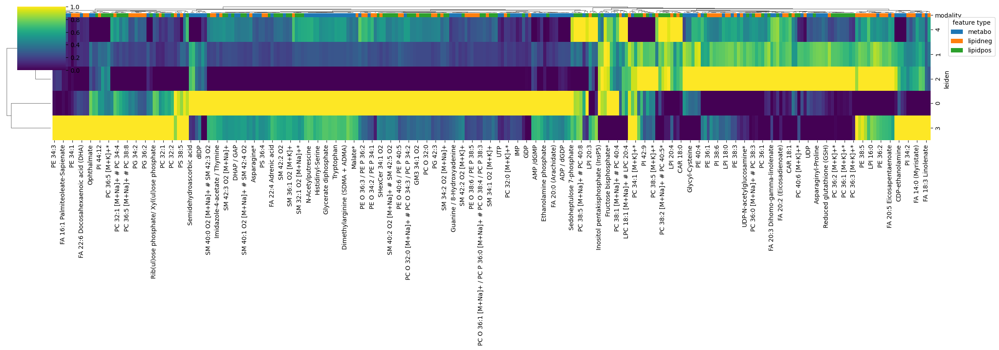

In [68]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# --- Leiden clustering on the RNA data ---
adata_rna = merged.copy()
sc.pp.normalize_total(adata_rna, target_sum=1e4)
sc.pp.log1p(adata_rna)
sc.pp.highly_variable_genes(adata_rna, n_top_genes=2000)
adata_rna = adata_rna[:, adata_rna.var["highly_variable"]].copy()
sc.pp.scale(adata_rna, max_value=10)
sc.tl.pca(adata_rna)
sc.pp.neighbors(adata_rna)
sc.tl.leiden(adata_rna, flavor="igraph", n_iterations=2, directed=False, resolution=0.5)

merged.obs["leiden"] = adata_rna.obs["leiden"].values
print(merged.obs["leiden"].value_counts())

# --- combine all metabo/lipidneg/lipidpos features into one table, tracking feature type ---
modality_colors = {"metabo": "tab:blue", "lipidneg": "tab:orange", "lipidpos": "tab:green"}

feature_dfs = []
feature_types = {}
for modality, color in modality_colors.items():
    df = merged.obsm[modality].fillna(0)
    feature_dfs.append(df)
    for col in df.columns:
        feature_types[col] = color

all_features = pd.concat(feature_dfs, axis=1)
all_features["leiden"] = merged.obs["leiden"].values
cluster_means = all_features.groupby("leiden").mean()  # rows = clusters, columns = features

col_colors = pd.Series(feature_types, name="modality")

g = sns.clustermap(
    cluster_means,
    cmap="viridis",
    standard_scale=1,  # scale each feature (column) independently, since units differ wildly
    col_colors=col_colors,
    figsize=(22, 8),
    dendrogram_ratio=(0.05, 0.05),
)

legend_elements = [Patch(facecolor=color, label=modality) for modality, color in modality_colors.items()]
g.ax_heatmap.legend(
    handles=legend_elements, title="feature type", loc="upper left",
    bbox_to_anchor=(1.02, 1), borderaxespad=0,
)
plt.show()


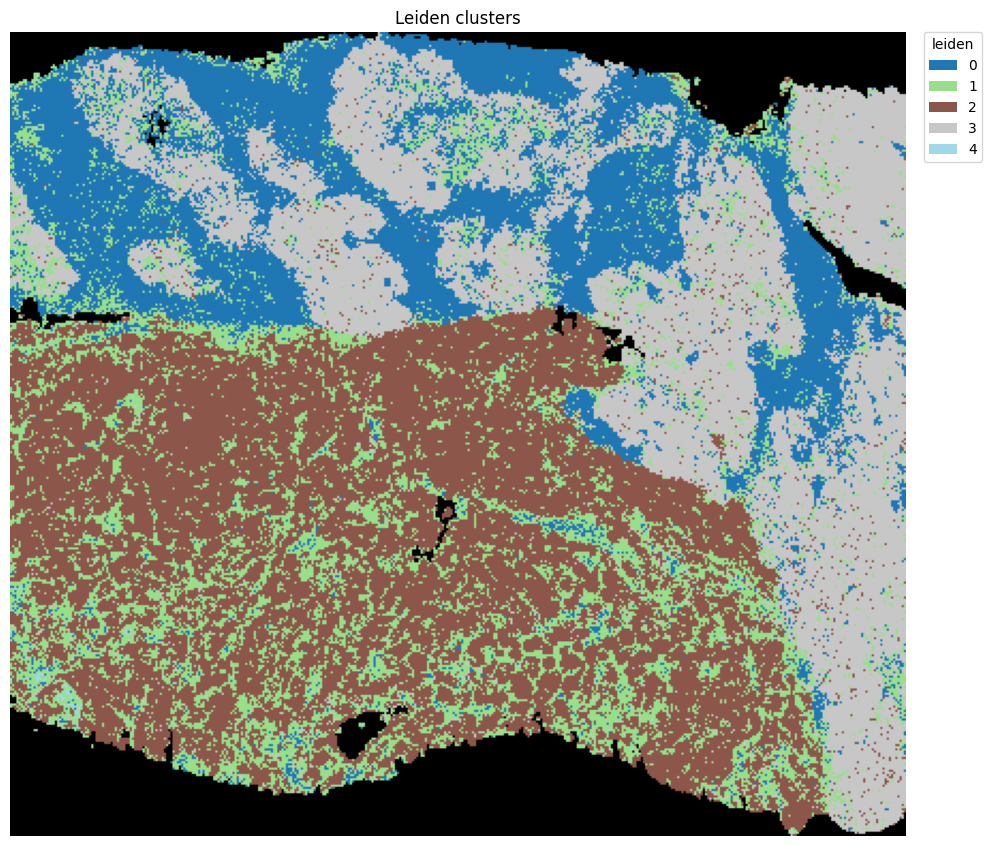

In [69]:
clusters = merged.obs["leiden"]
categories = clusters.cat.categories
cluster_colors = plt.get_cmap("tab20")(np.linspace(0, 1, len(categories)))[:, :3]

row = merged.obs["array_row"].values.astype(int)
col = merged.obs["array_col"].values.astype(int)
row0, col0 = row.min(), col.min()
n_rows, n_cols = row.max() - row0 + 1, col.max() - col0 + 1

cluster_grid = np.zeros((n_rows, n_cols, 3))
for i, cat in enumerate(categories):
    mask = (clusters == cat).values
    cluster_grid[row[mask] - row0, col[mask] - col0] = cluster_colors[i]

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(cluster_grid)
ax.axis("off")
ax.set_title("Leiden clusters")

legend_elements = [Patch(facecolor=cluster_colors[i], label=cat) for i, cat in enumerate(categories)]
ax.legend(handles=legend_elements, title="leiden", loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0)
plt.tight_layout()
plt.show()


In [71]:
sc.tl.umap(adata_rna, min_dist=0.1)

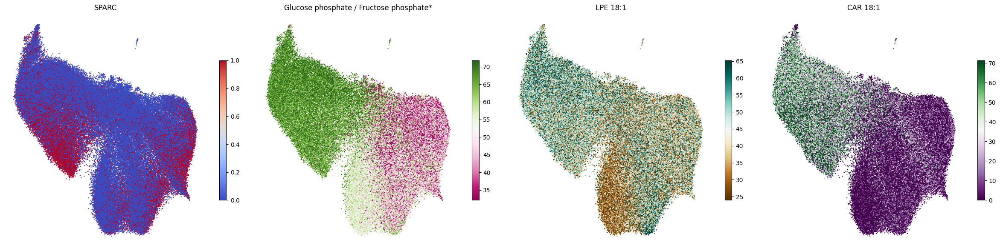

In [81]:
gene_name = "SPARC"
metabo_feature = "Glucose phosphate / Fructose phosphate*"
lipidneg_feature = "LPE 18:1"
lipidpos_feature = "CAR 18:1"

vmin_percentile = 5
vmax_percentile = 90
point_size = 0.5


umap_coords = adata_rna.obsm["X_umap"]

panels = [
    (gene_name, merged.obs_vector(gene_name), "coolwarm"),
    (metabo_feature, merged.obsm["metabo"][metabo_feature].fillna(0).values, "PiYG"),
    (lipidneg_feature, merged.obsm["lipidneg"][lipidneg_feature].fillna(0).values, "BrBG"),
    (lipidpos_feature, merged.obsm["lipidpos"][lipidpos_feature].fillna(0).values, "PRGn"),
]

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
for ax, (name, values, cmap) in zip(axes, panels):
    vmin = np.nanpercentile(values, vmin_percentile)
    vmax = np.nanpercentile(values, vmax_percentile)
    sca = ax.scatter(umap_coords[:, 0], umap_coords[:, 1], c=values, cmap=cmap, vmin=vmin, vmax=vmax, s=point_size)
    ax.set_title(name)
    ax.axis("off")
    plt.colorbar(sca, ax=ax, shrink=0.6)

plt.tight_layout()
plt.show()


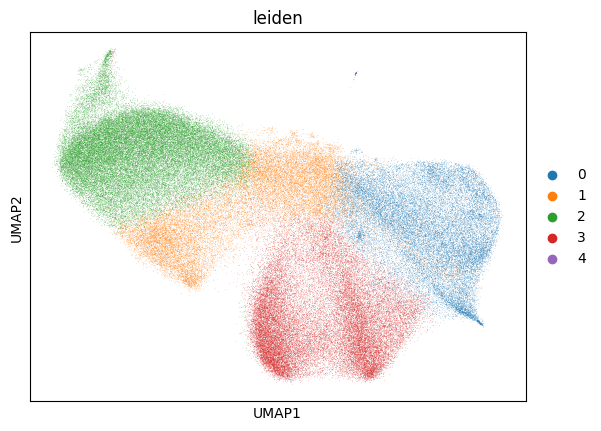

In [73]:
sc.pl.umap(adata_rna, color="leiden", size=point_size)

/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:459: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_gr

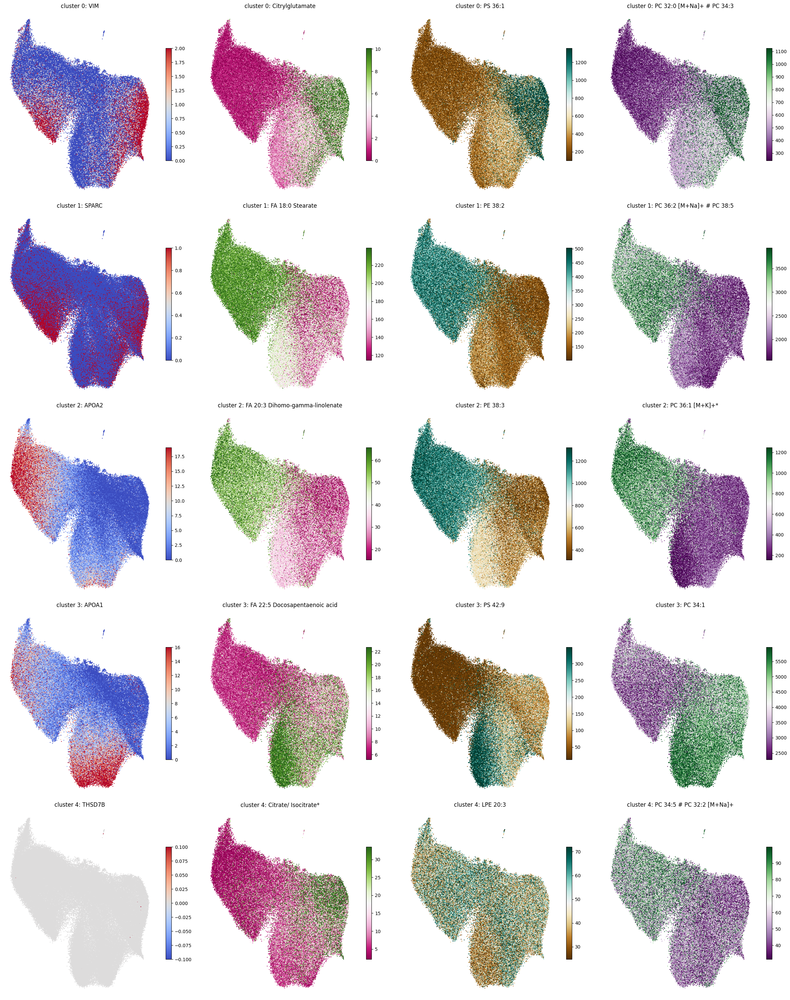

In [82]:
import anndata as ad

vmin_percentile = 5
vmax_percentile = 90
point_size = 0.5

umap_coords = adata_rna.obsm["X_umap"]
clusters = merged.obs["leiden"].cat.categories

# --- top RNA gene per cluster (reuses rank_genes_groups already run on adata_rna_full) ---
top_gene_per_cluster = {c: adata_rna_full.uns["rank_genes_groups"]["names"][c][0] for c in clusters}

# --- top feature per cluster for each MSI modality ---
modality_cmaps = {"metabo": "PiYG", "lipidneg": "BrBG", "lipidpos": "PRGn"}
top_feature_per_cluster = {}
for modality in modality_cmaps:
    feat_df = merged.obsm[modality].fillna(0)
    modality_adata = ad.AnnData(
        X=feat_df.values,
        obs=merged.obs[["leiden"]].copy(),
        var=pd.DataFrame(index=feat_df.columns),
    )
    sc.tl.rank_genes_groups(modality_adata, groupby="leiden", method="wilcoxon")
    top_feature_per_cluster[modality] = {
        c: modality_adata.uns["rank_genes_groups"]["names"][c][0] for c in clusters
    }

# --- grid: rows = clusters, columns = [gene, metabo, lipidneg, lipidpos] ---
fig, axes = plt.subplots(len(clusters), 4, figsize=(24, 6 * len(clusters)))

for row_idx, cluster in enumerate(clusters):
    panels = [(top_gene_per_cluster[cluster], merged.obs_vector(top_gene_per_cluster[cluster]), "coolwarm")]
    for modality, cmap in modality_cmaps.items():
        feature = top_feature_per_cluster[modality][cluster]
        panels.append((feature, merged.obsm[modality][feature].fillna(0).values, cmap))

    for col_idx, (name, values, cmap) in enumerate(panels):
        ax = axes[row_idx, col_idx]
        vmin = np.nanpercentile(values, vmin_percentile)
        vmax = np.nanpercentile(values, vmax_percentile)
        sca = ax.scatter(umap_coords[:, 0], umap_coords[:, 1], c=values, cmap=cmap, vmin=vmin, vmax=vmax, s=point_size)
        ax.set_title(f"cluster {cluster}: {name}")
        ax.axis("off")
        plt.colorbar(sca, ax=ax, shrink=0.6)

plt.tight_layout()
plt.show()


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


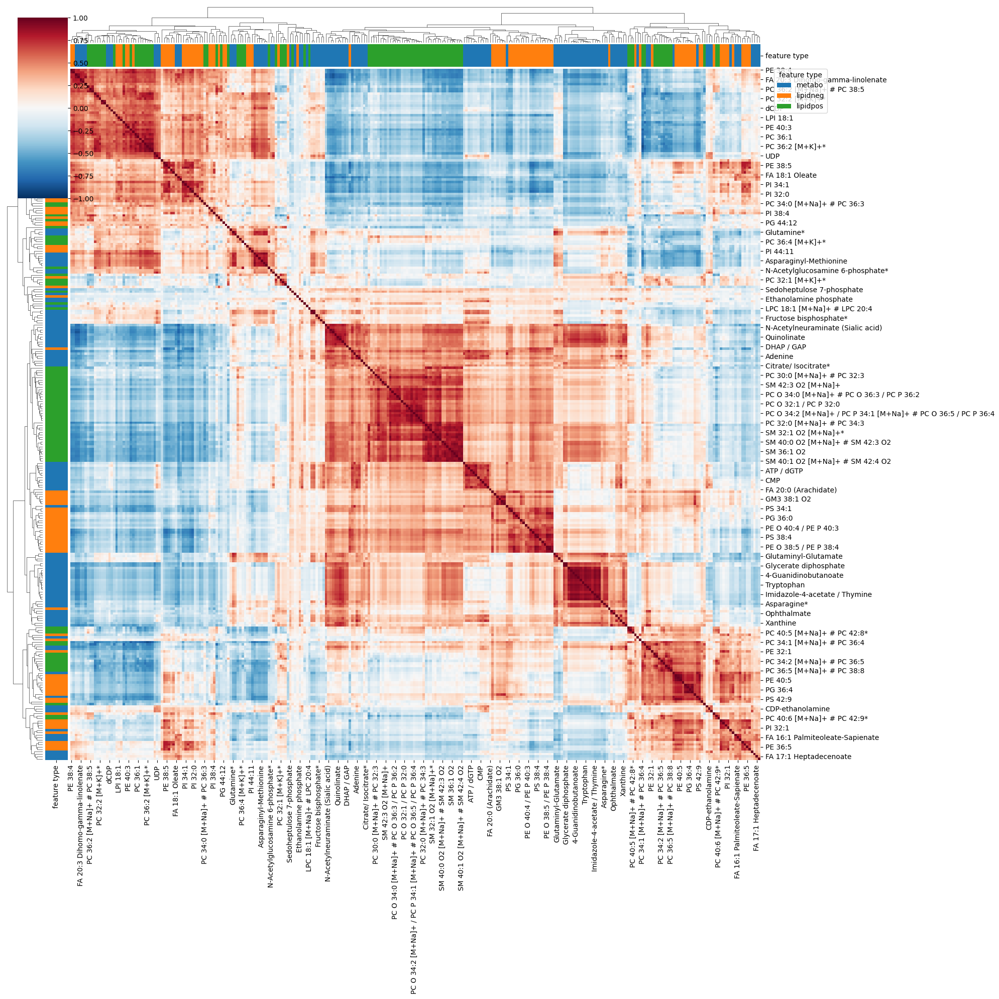

In [50]:
metabo_df = merged.obsm["metabo"].fillna(0)
lipidneg_df = merged.obsm["lipidneg"].fillna(0)
lipidpos_df = merged.obsm["lipidpos"].fillna(0)

all_features_df = pd.concat([metabo_df, lipidneg_df, lipidpos_df], axis=1)

# vectorized Pearson correlation, all-vs-all across the three modalities' features combined
feature_z = (all_features_df - all_features_df.mean()) / all_features_df.std()
corr = (feature_z.T.values @ feature_z.values) / len(all_features_df)
corr_df = pd.DataFrame(corr, index=all_features_df.columns, columns=all_features_df.columns)

modality_colors = {"metabo": "tab:blue", "lipidneg": "tab:orange", "lipidpos": "tab:green"}
feature_types = {}
for modality, df in [("metabo", metabo_df), ("lipidneg", lipidneg_df), ("lipidpos", lipidpos_df)]:
    for col in df.columns:
        feature_types[col] = modality_colors[modality]

annotation_colors = pd.Series(feature_types, name="feature type")

g = sns.clustermap(
    corr_df,
    cmap="RdBu_r",
    vmin=-1, vmax=1,
    row_colors=annotation_colors,
    col_colors=annotation_colors,
    figsize=(20, 20),
    dendrogram_ratio=(0.05, 0.05),
)

legend_elements = [Patch(facecolor=color, label=modality) for modality, color in modality_colors.items()]
g.ax_heatmap.legend(
    handles=legend_elements, title="feature type", loc="upper left",
    bbox_to_anchor=(1.02, 1), borderaxespad=0,
)
plt.show()


In [74]:
import scanpy as sc
import pandas as pd

adata_rna_full = merged.copy()
sc.pp.normalize_total(adata_rna_full, target_sum=1e4)
sc.pp.log1p(adata_rna_full)

sc.tl.rank_genes_groups(adata_rna_full, groupby="leiden", method="wilcoxon", use_raw=False)

top_n = 10
top_genes_per_cluster = {
    cluster: adata_rna_full.uns["rank_genes_groups"]["names"][cluster][:top_n]
    for cluster in adata_rna_full.obs["leiden"].cat.categories
}
top_genes_df = pd.DataFrame(top_genes_per_cluster)
print(top_genes_df)

# heatmap of these genes' mean expression per cluster, same recipe as the metabo/lipid one
top_genes = list(dict.fromkeys(top_genes_df.values.ravel()))
X_top = adata_rna_full[:, top_genes].X
if hasattr(X_top, "toarray"):
    X_top = X_top.toarray()
gene_df = pd.DataFrame(X_top, columns=top_genes, index=adata_rna_full.obs_names)
gene_df["leiden"] = adata_rna_full.obs["leiden"].values
cluster_means_genes = gene_df.groupby("leiden").mean()

sns.clustermap(
    cluster_means_genes,
    cmap="coolwarm",
    standard_scale=1,
    figsize=(20, 8),
    dendrogram_ratio=(0.05, 0.05),
)
plt.show()


/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/croizer/miniconda3/envs/msi/lib/python3.13/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


          0       1       2         3         4
0       VIM   SPARC   APOA2     APOA1    THSD7B
1      LMNA     VIM   EPHX1  SERPINA1    RSPH14
2      IGKC  COL4A2    CES1     ALDOB    ANKLE1
3  C11orf96  COL4A1    SPP1       FGB       OXT
4      JUNB    APOE    RBP4       VTN      GYG1
5    IGFBP7  COL3A1   APOC2       FGG    GASK1A
6     THBS1  PECAM1  UGT2B4       HPX    CD3EAP
7      EMP1  TMSB4X      CP      AHSG   C2orf69
8        C7  IGFBP5   ADH1B    IGFBP1     XRRA1
9       DCN     GSN     FN1      ORM1  HIST1H1E


InvalidIndexError: Reindexing only valid with uniquely valued Index objects

In [54]:
merged.write_h5ad("/home/croizer/Documents/04_Collaborations/03_Genial/SpatialWarp/DD1974/new_merged_visium_msi_dd1974.h5ad")

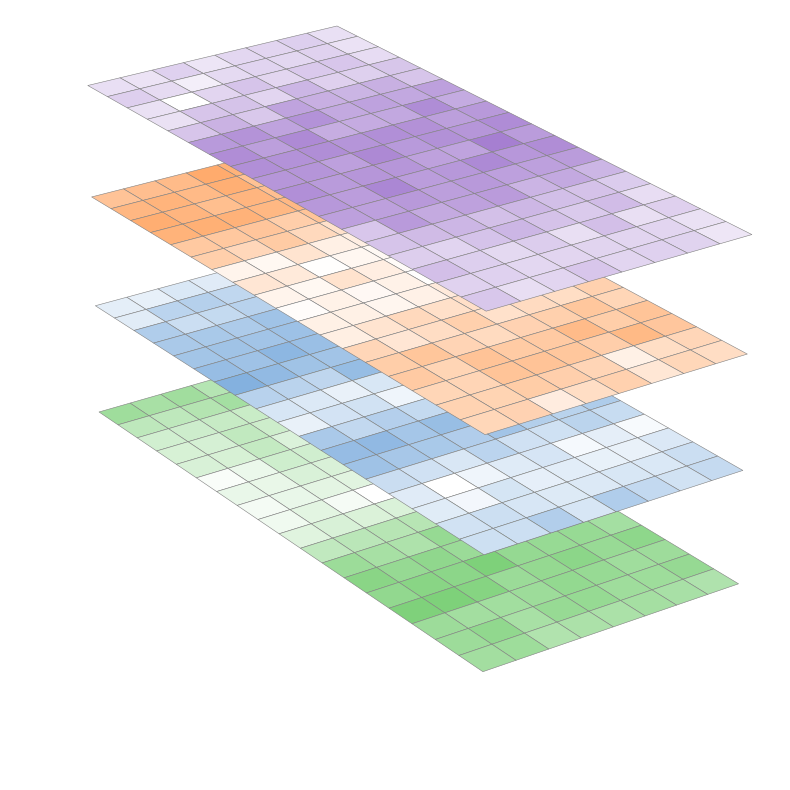

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # registers '3d' projection
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.colors import Normalize, LinearSegmentedColormap
from scipy.ndimage import zoom

rng = np.random.default_rng(0)
grid_rows, grid_cols = 8, 18

def dummy_field(coarse_rows=1, coarse_cols=7, cell_noise=0.1):
    coarse = rng.uniform(0, 1, size=(coarse_rows, coarse_cols))
    field = zoom(coarse, (grid_rows / coarse_rows, grid_cols / coarse_cols), order=1)
    field = field[:grid_rows, :grid_cols]
    field += rng.normal(0, cell_noise, size=field.shape)
    field -= field.min()
    field /= field.max()
    return field

def pastel_cmap(hex_color, name):
    # true white at the low end -> muted pastel hue at the high end
    return LinearSegmentedColormap.from_list(name, ["#ffffff", hex_color])

layers = [
    {"name": "Lipid neg", "values": dummy_field(), "cmap": pastel_cmap("#7ED17A", "pastel_green"),  "z": 0},
    {"name": "RNA",       "values": dummy_field(), "cmap": pastel_cmap("#7FAEDE", "pastel_blue"),   "z": 1.5},
    {"name": "Metabo",    "values": dummy_field(), "cmap": pastel_cmap("#FFA766", "pastel_orange"), "z": 3},
    {"name": "Lipid pos", "values": dummy_field(), "cmap": pastel_cmap("#A67FD1", "pastel_purple"), "z": 4.5},
]


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

for layer in layers:
    vals = layer["values"]
    norm = Normalize(vmin=vals.min(), vmax=vals.max())
    z = layer["z"]

    quads = []
    colors = []
    for i in range(grid_rows):
        for j in range(grid_cols):
            quads.append([
                (j,     i,     z),
                (j + 1, i,     z),
                (j + 1, i + 1, z),
                (j,     i + 1, z),
            ])
            colors.append(layer["cmap"](norm(vals[i, j])))

    pc = Poly3DCollection(quads, facecolors=colors, edgecolors="grey", linewidths=0.4)
    ax.add_collection3d(pc)

ax.set_xlim(0, grid_cols)
ax.set_ylim(0, grid_rows)
ax.set_zlim(0, 3)
ax.set_box_aspect([grid_cols, grid_rows, (grid_rows * 0.8)])

ax.set_axis_off()
ax.view_init(elev=25, azim=-35)

plt.tight_layout()
plt.savefig("/home/croizer/Documents/graphical_abstract.png", transparent=True, dpi=300, bbox_inches="tight")
plt.show()




KeyboardInterrupt



<Figure size 640x480 with 0 Axes>